In [1]:
import numpy as np
import qiskit as qk
from qiskit import QuantumCircuit, Aer
from qiskit.compiler import transpile
from qiskit.visualization import circuit_drawer, plot_state_city, plot_bloch_multivector, plot_histogram, plot_state_qsphere, plot_state_hinton
import os

In [9]:
# Create a directory to save the images
directory = 'visualizations'
if os.path.exists(directory):
    new_directory = directory + '_new'
    i = 1
    while os.path.exists(new_directory):
        new_directory = directory + '_new' + str(i)
        i += 1
    os.rename(directory, new_directory)
os.makedirs(directory)

# Create 1000 random quantum circuits with 3 qubits and 4 gates
for i in range(1):
    circ = QuantumCircuit(2, 2)
    circ.h(0)
    circ.x(1)
    circ.rz(np.pi, 0)
    circ.h(0)
    circ.measure([0, 1], [0, 1])

    # Draw the circuit and save as a PNG image file
    circuit_drawer(circ, output='mpl').savefig(f'visualizations/circuit_{i}.png')
    
    # Simulate the circuit to get the statevector and plot as a city plot and save as a PNG image file
    sim = Aer.get_backend('statevector_simulator')
    result = qk.execute(circ, sim).result()
    statevector = result.get_statevector(circ)
    plot_state_city(statevector).savefig(f'visualizations/statevector_city_{i}.png')

    # Plot the statevector on a Bloch sphere and save as a PNG image file
    plot_bloch_multivector(statevector).savefig(f'visualizations/bloch_{i}.png')

    # Simulate the circuit to get the histogram of measurement outcomes and plot as a histogram and save as a PNG image file
    sim = Aer.get_backend('qasm_simulator')
    result = qk.execute(circ, sim).result()
    counts = result.get_counts(circ)
    plot_histogram(counts).savefig(f'visualizations/histogram_{i}.png')

    # Plot the statevector on a Q-sphere and save as a PNG image file
    plot_state_qsphere(statevector).savefig(f'visualizations/qsphere_{i}.png')

    # Plot the statevector on a Hinton plot and save as a PNG image file
    plot_state_hinton(statevector).savefig(f'visualizations/hinton_{i}.png')

## Simiulating Random Circuits with specific number of gates and quabits

In [4]:
def create_data(num_gates, num_qubits):
    
    directory = 'visualizations'
    if os.path.exists(directory):
        new_directory = directory + '_new'
        i = 1
        while os.path.exists(new_directory):
            new_directory = directory + '_new' + str(i)
            i += 1
        os.rename(directory, new_directory)
    os.makedirs(directory)
    
    gates = ['H', 'Rx', 'S' ,'X', 'Y', 'CX', 'CZ', 'CY', 'Z', 'RZ', 'RY']

    for i in range(5):
        circuit = QuantumCircuit(num_qubits)
        for j in range(num_gates):
            gate = np.random.choice(gates)
            if gate == 'H':
                circuit.h(j % num_qubits)
            elif gate == 'Rx':
                circuit.rx(np.random.uniform(0, np.pi), j % num_qubits)
            elif gate == 'S':
                circuit.s(j % num_qubits)
            elif gate == 'X':
                circuit.x(j % num_qubits)
            elif gate == 'Y':
                circuit.y(j % num_qubits)
            elif gate == 'CX':
                qubit1 = np.random.randint(0, num_qubits)
                qubit2 = np.random.randint(0, num_qubits-1)
                if qubit2 >= qubit1:
                    qubit2 += 1
                circuit.cx(qubit1, qubit2)
            elif gate == 'CZ':
                qubit1 = np.random.randint(0, num_qubits)
                qubit2 = np.random.randint(0, num_qubits-1)
                if qubit2 >= qubit1:
                    qubit2 += 1
                circuit.cz(qubit1, qubit2)
            elif gate == 'CY':
                qubit1 = np.random.randint(0, num_qubits)
                qubit2 = np.random.randint(0, num_qubits-1)
                if qubit2 >= qubit1:
                    qubit2 += 1
                circuit.cy(qubit1, qubit2)
            elif gate == 'RZ':
                circuit.rz(np.random.uniform(0, np.pi), j % num_qubits)
            elif gate == 'RY':
                circuit.ry(np.random.uniform(0, np.pi), j % num_qubits)
            elif gate == 'Z':
                circuit.z(j % num_qubits)
        circuit.measure_all()        
        backend = Aer.get_backend('qasm_simulator')
        circuit = transpile(circuit, backend)        
        # Draw the circuit and save as PNG file
        circuit_drawer(circuit, output='mpl', filename='visualizations/circ{}_circuit.png'.format(i))

        # Simulate the circuit to get the statevector
        sim = Aer.get_backend('statevector_simulator')
        result = qk.execute(circuit, sim).result()
        statevector = result.get_statevector(circuit)

        # Plot the statevector as a city plot and save as PNG file
        plot_state_city(statevector).savefig('visualizations/circ{}_city.png'.format(i))

        # Plot the statevector on a Bloch sphere and save as PNG file
        plot_bloch_multivector(statevector).savefig('visualizations/circ{}_bloch.png'.format(i))

    # Simulate the circuit to get the histogram of measurement outcomes
        sim = Aer.get_backend('qasm_simulator')
        result = qk.execute(circuit, sim).result()
        counts = result.get_counts(circuit)

    # Plot the histogram of measurement outcomes and save as PNG file
        plot_histogram(counts).savefig('visualizations/circ{}_histogram.png'.format(i))

    # Plot the statevector on a Q-sphere and save as PNG file
        plot_state_qsphere(statevector).savefig('visualizations/circ{}_qsphere.png'.format(i))

    # Plot the statevector on a Hinton plot and save as PNG file
        plot_state_hinton(statevector).savefig('visualizations/circ{}_hinton.png'.format(i))

In [25]:
def create_data2(num_gates, num_qubits):

    # Create directory to store visualizations
    directory = 'visualizations'
    if os.path.exists(directory):
        new_directory = directory + '_new'
        i = 1
        while os.path.exists(new_directory):
            new_directory = directory + '_new' + str(i)
            i += 1
        os.rename(directory, new_directory)
    os.makedirs(directory)

    gates = ['H', 'Rx', 'S', 'X', 'Y', 'CX', 'CZ', 'CY', 'Z', 'RZ', 'RY']

    for i in range(10):
        # Create a quantum circuit with num_qubits qubits
        circuit = QuantumCircuit(num_qubits)

        # Apply num_gates random gates to the circuit
        for j in range(num_gates):
            gate = np.random.choice(gates)
            if gate == 'H':
                circuit.h(j % num_qubits)
            elif gate == 'Rx':
                circuit.rx(np.random.uniform(0, np.pi), j % num_qubits)
            elif gate == 'S':
                circuit.s(j % num_qubits)
            elif gate == 'X':
                circuit.x(j % num_qubits)
            elif gate == 'Y':
                circuit.y(j % num_qubits)
            elif gate == 'CX':
                qubit1 = np.random.randint(0, num_qubits)
                qubit2 = np.random.randint(0, num_qubits-1)
                if qubit2 >= qubit1:
                    qubit2 += 1
                circuit.cx(qubit1, qubit2)
            elif gate == 'CZ':
                qubit1 = np.random.randint(0, num_qubits)
                qubit2 = np.random.randint(0, num_qubits-1)
                if qubit2 >= qubit1:
                    qubit2 += 1
                circuit.cz(qubit1, qubit2)
            elif gate == 'CY':
                qubit1 = np.random.randint(0, num_qubits)
                qubit2 = np.random.randint(0, num_qubits-1)
                if qubit2 >= qubit1:
                    qubit2 += 1
                circuit.cy(qubit1, qubit2)
            elif gate == 'RZ':
                circuit.rz(np.random.uniform(0, np.pi), j % num_qubits)
            elif gate == 'RY':
                circuit.ry(np.random.uniform(0, np.pi), j % num_qubits)
            elif gate == 'Z':
                circuit.z(j % num_qubits)
        circuit.measure_all()
        # Transpile the circuit to the most suitable form for the simulator/backend
        backend = Aer.get_backend('qasm_simulator')
        circuit = transpile(circuit, backend)

        # Draw the circuit and save as PNG file
        circuit_drawer(circuit, output='mpl', filename='visualizations/circuit{}.png'.format(i))

        # Simulate the circuit to get the statevector
        sim = Aer.get_backend('statevector_simulator')
        result = qk.execute(circuit, sim).result()
        statevector = result.get_statevector(circuit)

        # Plot the statevector as a city plot and save as PNG file
        #plot_state_city(statevector).savefig('visualizations/circ{}_city.png'.format(i))

        # Plot the statevector on a Bloch sphere and save as PNG file
        plot_bloch_multivector(statevector).savefig('visualizations/bloch{}.png'.format(i))

    # Simulate the circuit to get the histogram of measurement outcomes
        sim = Aer.get_backend('qasm_simulator')
        result = qk.execute(circuit, sim).result()
        counts = result.get_counts(circuit)

    # Plot the histogram of measurement outcomes and save as PNG file
        #plot_histogram(counts).savefig('visualizations/circ{}_histogram.png'.format(i))

    # Plot the statevector on a Q-sphere and save as PNG file
        #plot_state_qsphere(statevector).savefig('visualizations/circ{}_qsphere.png'.format(i))

    # Plot the statevector on a Hinton plot and save as PNG file
        #plot_state_hinton(statevector).savefig('visualizations/circ{}_hinton.png'.format(i))

    


In [ ]:
create_data(2, 3)

In [26]:
create_data2(2, 3)

### VISUALIZATIONS

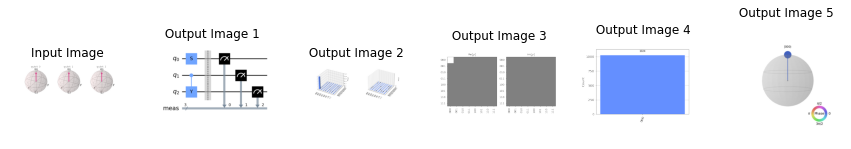

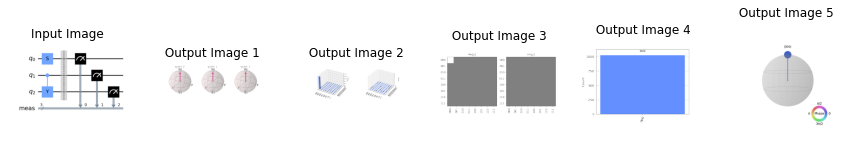

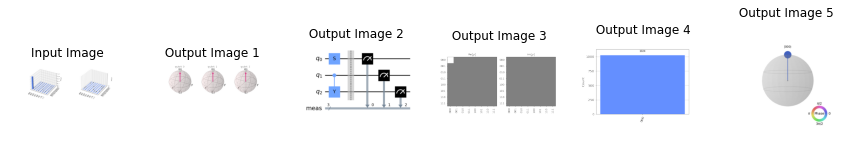

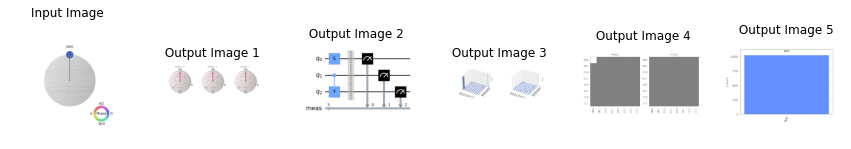

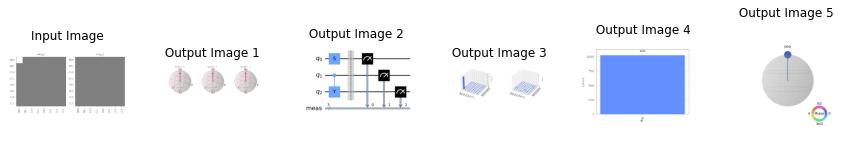

...

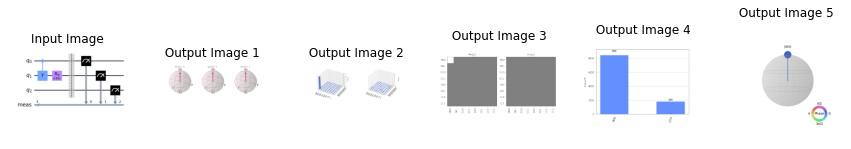

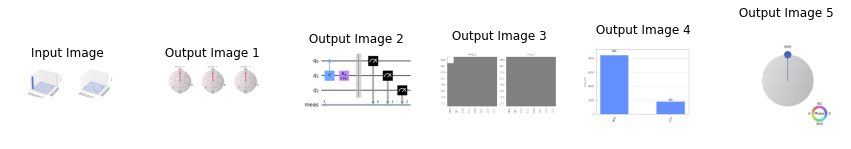

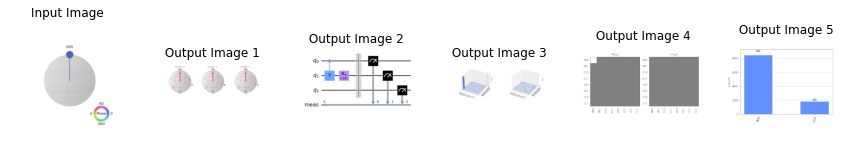

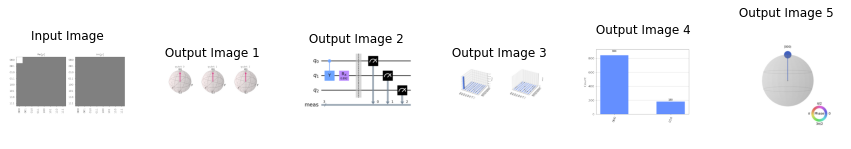

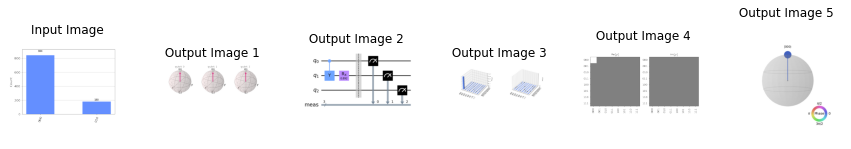

In [15]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import NullLocator

input_dir = '/Users/temitopeadeniyi/visualizations'
output_dir = '/Users/temitopeadeniyi/visualizations_out'

# Get a list of all the circuit directories
circuit_dirs = [dir for dir in os.listdir(input_dir) if not dir.startswith('.')]
# Loop over all the circuit directories
for circuit_num, circuit_dir in enumerate(circuit_dirs):
    # Get a list of all the visualization files for this circuit
    visualization_files = os.listdir(os.path.join(input_dir, circuit_dir))

    # Loop over all the visualization files
    for visualization_file_num, visualization_file in enumerate(visualization_files):
        # Load the input and output images
        input_image = plt.imread(os.path.join(input_dir, circuit_dir, visualization_file))
        output_images = []
        for i in range(1, 7):
            if f'visualization{i}.png' != visualization_file:
                output_image = plt.imread(os.path.join(output_dir, circuit_dir, f'visualization{i}.png'))
                output_images.append(output_image)
        
        # Create a subplot with the input image and all the output images
        fig, axs = plt.subplots(1, 6, figsize=(15, 5))
        axs[0].imshow(input_image)
        axs[0].set_title(f'Input Image')
        axs[0].axis('off')
        for i in range(5):
            axs[i+1].imshow(output_images[i])
            axs[i+1].set_title(f' Output Image {i+1}')
            axs[i+1].axis('off')
        #plt.savefig('Visualizations_comb{}.png'.format(i), dpi=300, bbox_inches='tight')
        # Set the title of the subplot to the name of the input image file
        #fig.suptitle(f'Circuit {circuit_num+1} - Visualization {visualization_file_num+1}')
        
        # Remove the default axis ticks and labels
        for ax in axs:
            ax.xaxis.set_major_locator(NullLocator())
            ax.yaxis.set_major_locator(NullLocator())

        # Set the spacing between subplots
        fig.subplots_adjust(hspace=0.3)
        #plt.savefig('Visualizations_comb{}.png'.format(i), dpi=300, bbox_inches='tight')
        # Show the plot
    plt.show()


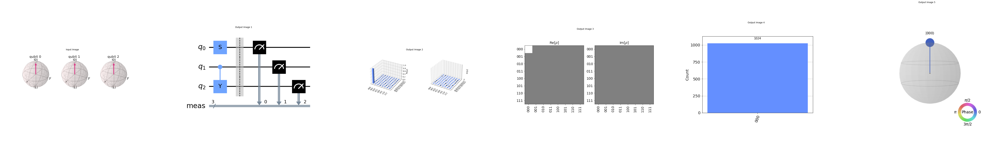

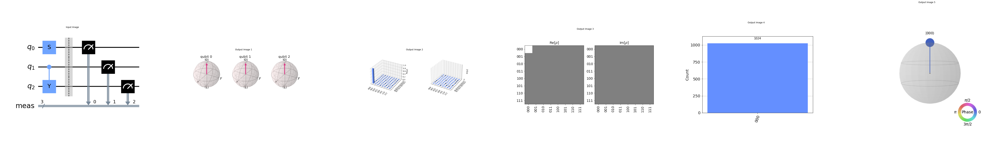

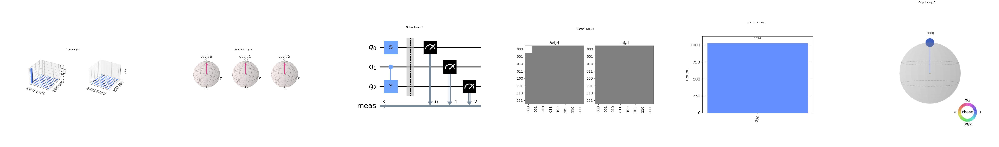

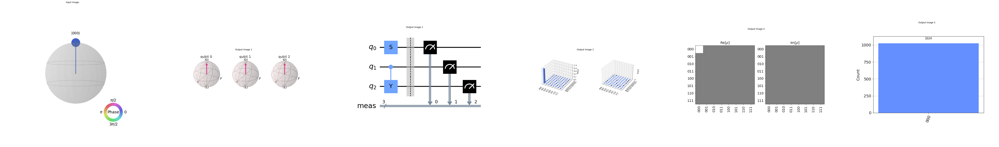

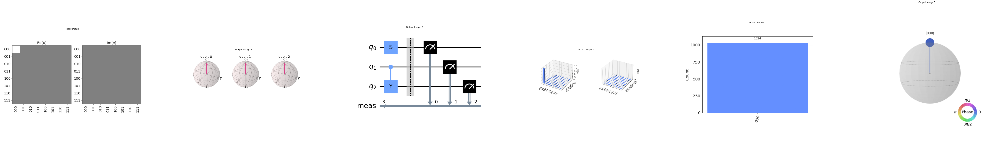

...

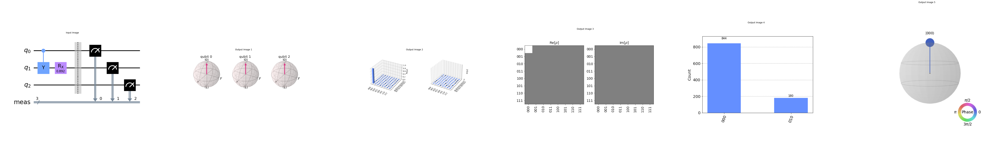

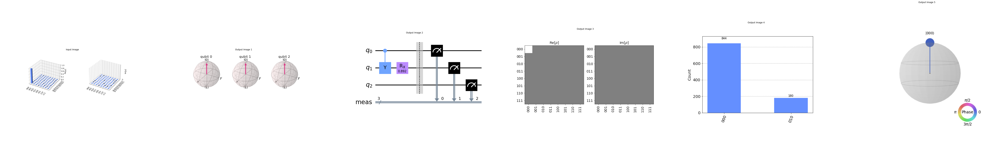

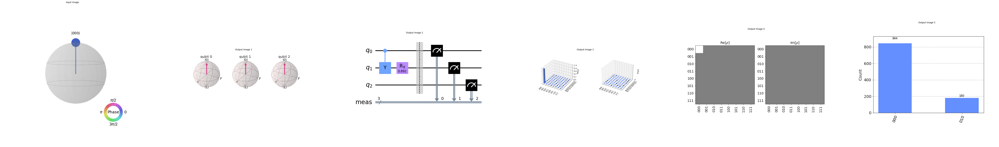

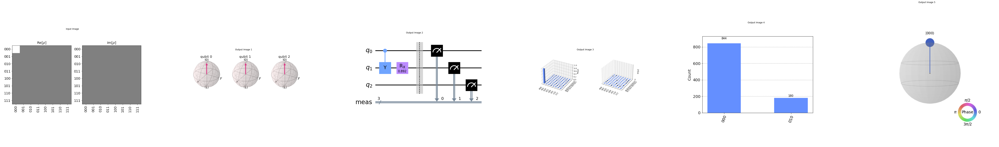

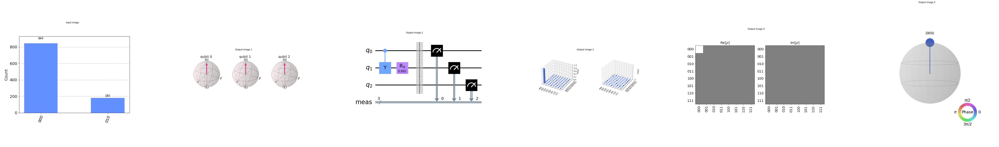

In [21]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import NullLocator

input_dir = '/Users/temitopeadeniyi/visualizations'
output_dir = '/Users/temitopeadeniyi/visualizations_out'

# Get a list of all the circuit directories
circuit_dirs = [dir for dir in os.listdir(input_dir) if not dir.startswith('.')]
# Loop over all the circuit directories
for circuit_num, circuit_dir in enumerate(circuit_dirs):
    # Get a list of all the visualization files for this circuit
    visualization_files = os.listdir(os.path.join(input_dir, circuit_dir))

    # Loop over all the visualization files
    for visualization_file_num, visualization_file in enumerate(visualization_files):
        # Load the input and output images
        input_image = plt.imread(os.path.join(input_dir, circuit_dir, visualization_file))
        output_images = []
        for i in range(1, 7):
            if f'visualization{i}.png' != visualization_file:
                output_image = plt.imread(os.path.join(output_dir, circuit_dir, f'visualization{i}.png'))
                output_images.append(output_image)
        
        # Create a subplot with the input image and all the output images
        fig, axs = plt.subplots(1, 6, figsize=(100, 60))
        axs[0].imshow(input_image)
        axs[0].set_title(f'Input Image')
        axs[0].axis('off')
        for i in range(5):
            axs[i+1].imshow(output_images[i])
            axs[i+1].set_title(f' Output Image {i+1}')
            axs[i+1].axis('off')
        # Set the title of the subplot to the name of the input image file
        #fig.suptitle(f'Circuit {circuit_num+1} - Visualization {visualization_file_num+1}')
        
        # Remove the default axis ticks and labels
        for ax in axs:
            ax.xaxis.set_major_locator(NullLocator())
            ax.yaxis.set_major_locator(NullLocator())

        # Set the spacing between subplots
        fig.subplots_adjust(hspace=0.3)
        
        # Save the plot to device
        plt.savefig(f'circuit_{circuit_num+1}_visualization_{visualization_file_num+1}.png', dpi=300, bbox_inches='tight')
        
        # Show the plot
        plt.show()


### CNN MODEL

In [89]:
import os
from PIL import Image

# Define the folder where the visualizations are stored
folder = '/Users/temitopeadeniyi/visualizations'

# Define the list of visualization types
vis_types = ['bloch', 'circuit', 'hinton', 'city', 'histogram', 'qsphere']

# Define the number of circuits
num_circuits = 5

# Create empty lists to store input-output pairs
inputs = []
outputs = []

# Loop over each circuit
for i in range(num_circuits):
    # Loop over each visualization type
    for j, vis_type in enumerate(vis_types):
        # Load the input image (drawn circuit visualization)
        input_path = os.path.join(folder, vis_type + str(i) + '.png')
        input_img = Image.open(input_path)
        # Append the input image to the inputs list
        inputs.append(np.array(input_img))
        # Loop over each visualization type (excluding the current one)
        for k, output_type in enumerate(vis_types[:j] + vis_types[j+1:]):
            # Load the corresponding output image
            output_path = os.path.join(folder, output_type + str(i) + '.png')
            output_img = Image.open(output_path)
            # Append the output image to the outputs list
            outputs.append(np.array(output_img))

# Convert inputs and outputs to numpy arrays
inputs = np.array(inputs)
outputs = np.array(outputs)

/var/folders/3x/sg00y37n2rg22srjzxtsqjqw0000gn/T/ipykernel_3345/2905856619.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  inputs = np.array(inputs)
/var/folders/3x/sg00y37n2rg22srjzxtsqjqw0000gn/T/ipykernel_3345/2905856619.py:36: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  outputs = np.array(outputs)


In [65]:
inputs

array([array([[[255, 255, 255,   0],
               [255, 255, 255,   0],
               [255, 255, 255,   0],
               ...,
               [255, 255, 255,   0],
               [255, 255, 255,   0],
               [255, 255, 255,   0]],

              [[255, 255, 255,   0],
               [255, 255, 255,   0],
               [255, 255, 255,   0],
               ...,
               [255, 255, 255,   0],
               [255, 255, 255,   0],
               [255, 255, 255,   0]],

              [[255, 255, 255,   0],
               [255, 255, 255,   0],
               [255, 255, 255,   0],
               ...,
               [255, 255, 255,   0],
               [255, 255, 255,   0],
               [255, 255, 255,   0]],

              ...,

              [[255, 255, 255,   0],
               [255, 255, 255,   0],
               [255, 255, 255,   0],
               ...,
               [255, 255, 255,   0],
               [255, 255, 255,   0],
               [255, 255, 255,   0]],

    

In [ ]:
import os
import cv2
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import ImageDataGenerator

input_dir = '/Users/temitopeadeniyi/visualizations'
output_dir = '/Users/temitopeadeniyi/visualizations_out'

# Define the fixed size of the input and output images
img_height, img_width = 224, 224

# Get a list of all the circuit directories
circuit_dirs = [dir for dir in os.listdir(input_dir) if not dir.startswith('.')]
# Loop over all the circuit directories
image_pairs = []
for circuit_num, circuit_dir in enumerate(circuit_dirs):
    # Get a list of all the visualization files for this circuit
    visualization_files = os.listdir(os.path.join(input_dir, circuit_dir))

    # Loop over all the visualization files
    for visualization_file_num, visualization_file in enumerate(visualization_files):
        # Load the input and output images
        input_image = cv2.imread(os.path.join(input_dir, circuit_dir, visualization_file))
        input_image = cv2.resize(input_image, (img_height, img_width))
        output_images = []
        for i in range(1, 7):
            if f'visualization{i}.png' != visualization_file:
                output_image = cv2.imread(os.path.join(output_dir, circuit_dir, f'visualization{i}.png'))
                output_image = cv2.resize(output_image, (img_height, img_width))
                output_images.append(output_image)

        # Append the input-output pair to the list
        image_pair = (input_image, np.stack(output_images))
        image_pairs.append(image_pair)

np.random.shuffle(image_pairs)

# Create a data generator for the image pairs
train_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow(np.array([pair[0] for pair in image_pairs]), np.array([pair[1] for pair in image_pairs]), batch_size=32)


In [194]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Concatenate

# Define the input shape of the images
input_shape = (None, None, 3)  # Assumes RGB images

# Define the number of output images
num_outputs = 5

# Define the CNN model architecture
inputs = Input(shape=input_shape)
x = Conv2D(filters=16, kernel_size=3, padding='same', activation='relu')(inputs)
x = MaxPooling2D(pool_size=2)(x)
x = Conv2D(filters=32, kernel_size=3, padding='same', activation='relu')(x)
x = MaxPooling2D(pool_size=2)(x)
x = Conv2D(filters=64, kernel_size=3, padding='same', activation='relu')(x)
encoded = MaxPooling2D(pool_size=2)(x)

x = Conv2D(filters=64, kernel_size=3, padding='same', activation='relu')(encoded)
x = UpSampling2D(size=2)(x)
x = Conv2D(filters=32, kernel_size=3, padding='same', activation='relu')(x)
x = UpSampling2D(size=2)(x)
x = Conv2D(filters=16, kernel_size=3, padding='same', activation='relu')(x)
x = UpSampling2D(size=2)(x)
#decoded = Conv2D(filters=num_outputs, kernel_size=3, padding='same', activation='sigmoid')(x)
decoded = []
for i in range(num_outputs):
    output = Conv2D(filters=1, kernel_size=3, padding='same', activation='sigmoid')(x)
    decoded.append(output)
#decoded = Concatenate(axis=-1)(decoded)
# Define the model
model = Model(inputs=inputs, outputs=decoded)

# Compile the model with appropriate loss and optimizer

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='mse', metrics=['accuracy'])

In [195]:
history = model.fit(train_generator)

2023-04-18 17:43:22.798960: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


InvalidArgumentError: Graph execution error:

Detected at node 'remove_squeezable_dimensions_4/Squeeze' defined at (most recent call last):
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/ipykernel_launcher.py", line 16, in <module>
      app.launch_new_instance()
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/traitlets/config/application.py", line 846, in launch_instance
      app.start()
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/ipykernel/kernelapp.py", line 677, in start
      self.io_loop.start()
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 199, in start
      self.asyncio_loop.run_forever()
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/asyncio/base_events.py", line 596, in run_forever
      self._run_once()
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/asyncio/base_events.py", line 1890, in _run_once
      handle._run()
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/asyncio/events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 471, in dispatch_queue
      await self.process_one()
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 460, in process_one
      await dispatch(*args)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 367, in dispatch_shell
      await result
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 662, in execute_request
      reply_content = await reply_content
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 360, in do_execute
      res = shell.run_cell(code, store_history=store_history, silent=silent)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/ipykernel/zmqshell.py", line 532, in run_cell
      return super().run_cell(*args, **kwargs)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 2880, in run_cell
      result = self._run_cell(
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 2935, in _run_cell
      return runner(coro)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3134, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3337, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3397, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "/var/folders/3x/sg00y37n2rg22srjzxtsqjqw0000gn/T/ipykernel_3345/1298494088.py", line 1, in <cell line: 1>
      history = model.fit(train_generator)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/engine/training.py", line 1650, in fit
      tmp_logs = self.train_function(iterator)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/engine/training.py", line 1249, in train_function
      return step_function(self, iterator)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/engine/training.py", line 1233, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/engine/training.py", line 1222, in run_step
      outputs = model.train_step(data)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/engine/training.py", line 1028, in train_step
      return self.compute_metrics(x, y, y_pred, sample_weight)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/engine/training.py", line 1122, in compute_metrics
      self.compiled_metrics.update_state(y, y_pred, sample_weight)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/engine/compile_utils.py", line 605, in update_state
      metric_obj.update_state(y_t, y_p, sample_weight=mask)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/utils/metrics_utils.py", line 77, in decorated
      update_op = update_state_fn(*args, **kwargs)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/metrics/base_metric.py", line 140, in update_state_fn
      return ag_update_state(*args, **kwargs)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/metrics/base_metric.py", line 684, in update_state
      y_pred, y_true = losses_utils.squeeze_or_expand_dimensions(
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/utils/losses_utils.py", line 200, in squeeze_or_expand_dimensions
      y_true, y_pred = remove_squeezable_dimensions(y_true, y_pred)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/utils/losses_utils.py", line 139, in remove_squeezable_dimensions
      labels = tf.squeeze(labels, [-1])
Node: 'remove_squeezable_dimensions_4/Squeeze'
Detected at node 'remove_squeezable_dimensions_4/Squeeze' defined at (most recent call last):
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/ipykernel_launcher.py", line 16, in <module>
      app.launch_new_instance()
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/traitlets/config/application.py", line 846, in launch_instance
      app.start()
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/ipykernel/kernelapp.py", line 677, in start
      self.io_loop.start()
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 199, in start
      self.asyncio_loop.run_forever()
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/asyncio/base_events.py", line 596, in run_forever
      self._run_once()
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/asyncio/base_events.py", line 1890, in _run_once
      handle._run()
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/asyncio/events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 471, in dispatch_queue
      await self.process_one()
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 460, in process_one
      await dispatch(*args)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 367, in dispatch_shell
      await result
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 662, in execute_request
      reply_content = await reply_content
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 360, in do_execute
      res = shell.run_cell(code, store_history=store_history, silent=silent)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/ipykernel/zmqshell.py", line 532, in run_cell
      return super().run_cell(*args, **kwargs)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 2880, in run_cell
      result = self._run_cell(
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 2935, in _run_cell
      return runner(coro)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3134, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3337, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3397, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "/var/folders/3x/sg00y37n2rg22srjzxtsqjqw0000gn/T/ipykernel_3345/1298494088.py", line 1, in <cell line: 1>
      history = model.fit(train_generator)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/engine/training.py", line 1650, in fit
      tmp_logs = self.train_function(iterator)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/engine/training.py", line 1249, in train_function
      return step_function(self, iterator)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/engine/training.py", line 1233, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/engine/training.py", line 1222, in run_step
      outputs = model.train_step(data)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/engine/training.py", line 1028, in train_step
      return self.compute_metrics(x, y, y_pred, sample_weight)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/engine/training.py", line 1122, in compute_metrics
      self.compiled_metrics.update_state(y, y_pred, sample_weight)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/engine/compile_utils.py", line 605, in update_state
      metric_obj.update_state(y_t, y_p, sample_weight=mask)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/utils/metrics_utils.py", line 77, in decorated
      update_op = update_state_fn(*args, **kwargs)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/metrics/base_metric.py", line 140, in update_state_fn
      return ag_update_state(*args, **kwargs)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/metrics/base_metric.py", line 684, in update_state
      y_pred, y_true = losses_utils.squeeze_or_expand_dimensions(
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/utils/losses_utils.py", line 200, in squeeze_or_expand_dimensions
      y_true, y_pred = remove_squeezable_dimensions(y_true, y_pred)
    File "/Users/temitopeadeniyi/opt/anaconda3/envs/tensorflow_m1/lib/python3.9/site-packages/keras/utils/losses_utils.py", line 139, in remove_squeezable_dimensions
      labels = tf.squeeze(labels, [-1])
Node: 'remove_squeezable_dimensions_4/Squeeze'
2 root error(s) found.
  (0) INVALID_ARGUMENT:  Can not squeeze dim[4], expected a dimension of 1, got 3
	 [[{{node remove_squeezable_dimensions_4/Squeeze}}]]
	 [[model_4/up_sampling2d_17/mul/_32]]
  (1) INVALID_ARGUMENT:  Can not squeeze dim[4], expected a dimension of 1, got 3
	 [[{{node remove_squeezable_dimensions_4/Squeeze}}]]
0 successful operations.
0 derived errors ignored. [Op:__inference_train_function_26056]

In [ ]:
pip install sk

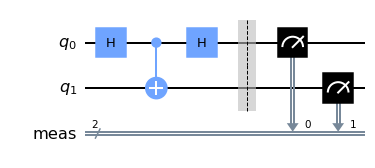

In [37]:
from qiskit import QuantumCircuit, Aer, execute
from qiskit.visualization import plot_bloch_multivector

# Create a quantum circuit with two qubits
qc = QuantumCircuit(2)

# Apply a Y gate to the first qubit and CY gates to the second qubit

qc.h(0)
qc.cx(0, 1)
qc.h(0)
qc.measure_all()
# Simulate the circuit on the statevector simulator
simulator = Aer.get_backend('statevector_simulator')
result = execute(qc, simulator).result()
statevector = result.get_statevector()
plot_bloch_multivector(statevector).savefig('sample_bloch222')
# Plot the Bloch sphere of the statevector
#plot_bloch_multivector(statevector)
circuit_drawer(qc, output='mpl', filename='sample_circuit222')
#qc.draw(output ='mpl')